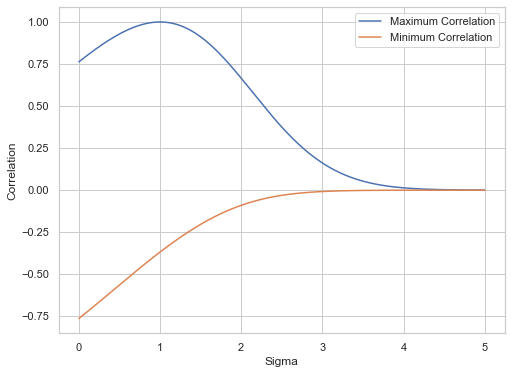

In [1]:
import numpy as np 
import matplotlib.pyplot as plt
import pandas as pd 
import seaborn as sns
sns.set(style="whitegrid")
from scipy import stats
import scipy 
plt.rcParams["figure.figsize"] = (8,6)

"""   Exercise 1 """
def att_correlation(sigma, type_):
    #compute the covariance E(exp(sigma+1)Z) - E(exp(Z))E(exp(sigma * Z))
    
    if type_ == "min":
        corr_min = (np.exp(-sigma)-1)/ np.sqrt( (np.exp(1)-1)*(np.exp(sigma**2)-1))
        return corr_min
    if type_ == "max":
        corr_max = (np.exp(sigma)-1)/ np.sqrt( (np.exp(1)-1)*(np.exp(sigma**2)-1))
        return corr_max
    
sigma = np.linspace(0.00001,5, 1000)
corr_maximum = att_correlation(sigma, "max")
corr_minimum = att_correlation(sigma, "min")

plt.plot(sigma, corr_maximum, label = "Maximum Correlation")
plt.plot(sigma, corr_minimum, label = "Minimum Correlation")
plt.xlabel("Sigma")
plt.ylabel("Correlation")
plt.legend()
plt.savefig("homework7_ex1.png")
plt.show()

In [2]:
""" Exercise 4 """
#load the data 
data = pd.read_csv("futures.csv")
data = data.set_index("date")

#calculate the returns 
ret = data/data.shift(1) - 1
ret = ret.loc[(ret != 0).all(axis=1)]
rank = ret.rank(axis = 0, method = "dense")
rank_norm = rank/rank.max()

rank_norm

,Wheat,Corn,Dow Jones,British Pound,Swiss Frank,SP500,Nikkei
date,,,,,,,
1959-07-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1959-07-02,0.623930,0.502369,NaN,NaN,NaN,NaN,NaN
1959-07-06,0.505004,0.351578,NaN,NaN,NaN,NaN,NaN
1959-07-08,0.395504,0.501713,NaN,NaN,NaN,NaN,NaN
1959-07-09,0.360986,0.639822,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
2021-09-13,0.439666,0.222724,0.804256,0.421043,0.193264,0.595954,0.894375
2021-09-14,0.919217,0.879601,0.166942,0.392627,0.750024,0.228300,0.227565
2021-09-15,0.885932,0.959405,0.781691,0.594893,0.460129,0.825384,0.757979


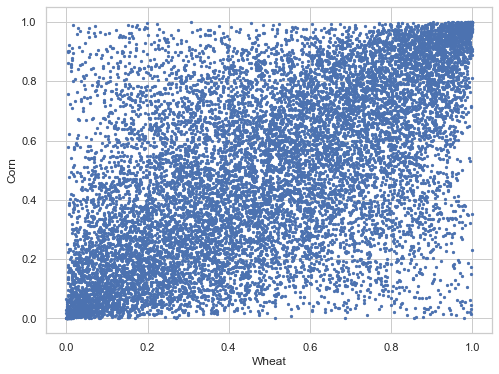

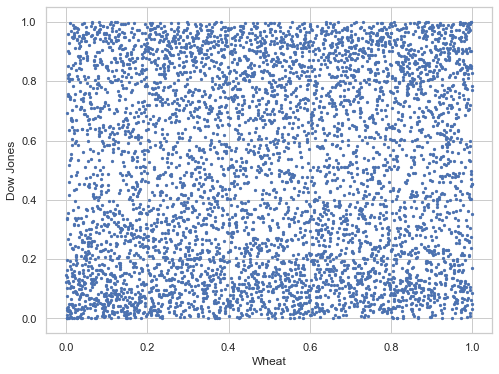

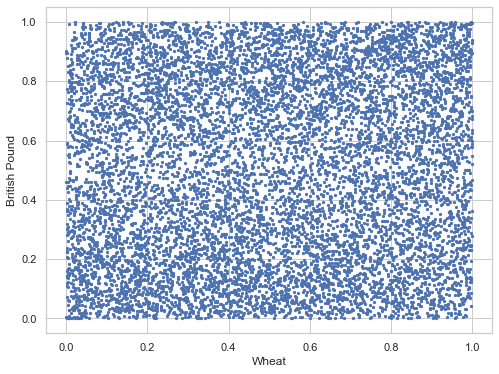

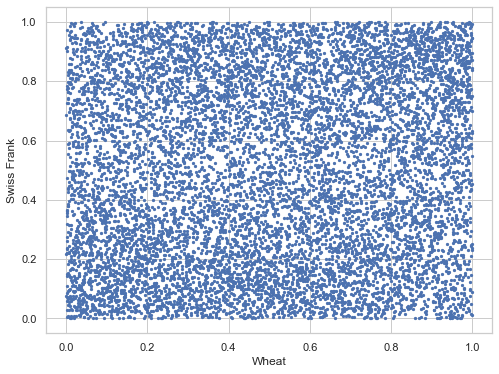

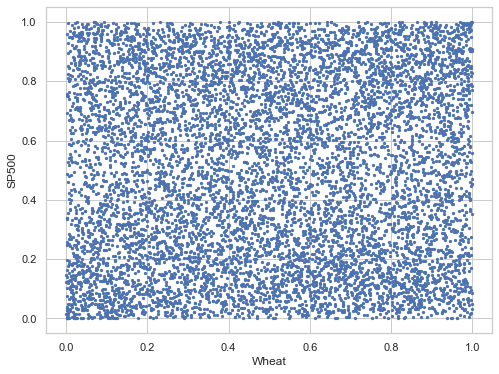

...

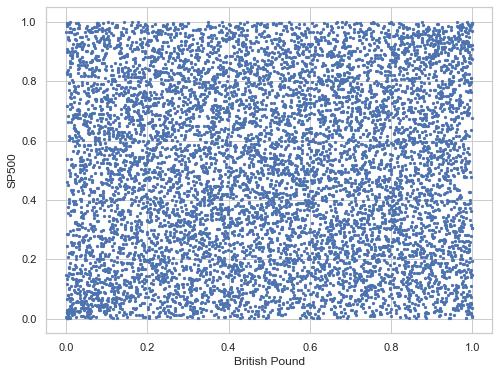

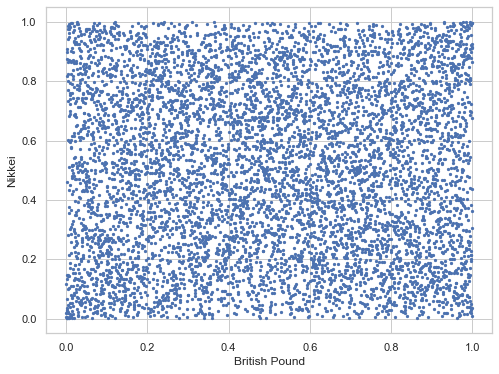

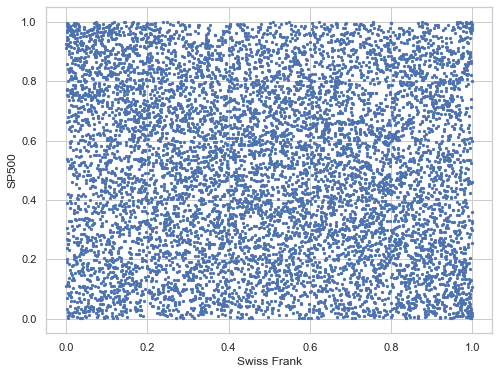

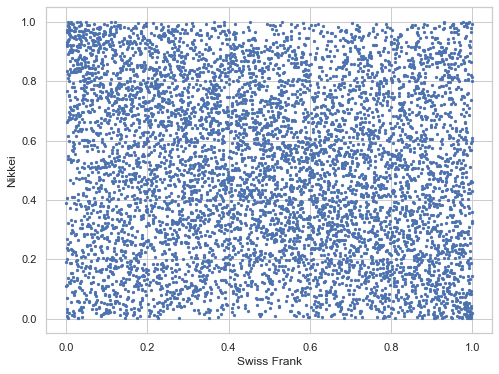

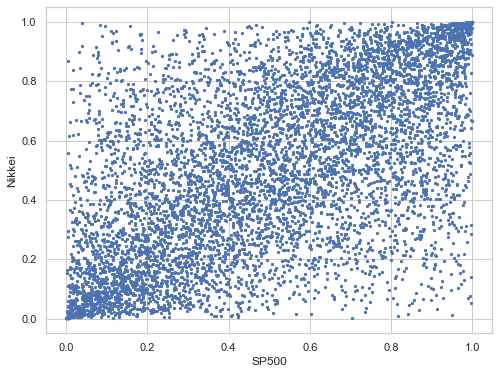

In [3]:
def scatter(r, j, i, show = True):
        df = r.iloc[:, [i,j]].dropna().to_numpy()
        plt.scatter(df[:,0], df[:,1], label = "Observed", s = 5)
        plt.xlabel(r.columns[j])
        plt.ylabel(r.columns[i])
        if show:
            plt.show()
    


#plot the returns, does it look elliptical ? 
for j in range(len(ret.columns)-1):
    for i in range(j+1,len(ret.columns)):
        scatter(rank_norm, j, i)
        

In [4]:
#estimating the pairwise correlations 
def get_correlation(ret, i, j):
        df = ret.iloc[:, [i,j]].dropna().to_numpy()
        return np.corrcoef(df[:,0], df[:,1])[0,1]
    
correlations = dict()
for j in range(len(ret.columns)-1):
    for i in range(j+1,len(ret.columns)):
        n1, n2 = ret.columns[j], ret.columns[i]
        correlations[f"{n1}-{n2}"] = get_correlation(ret, i, j)


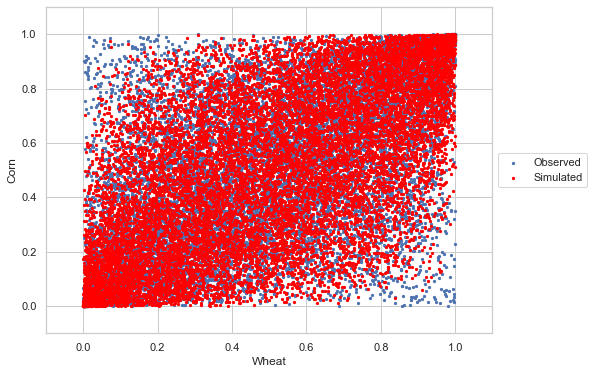

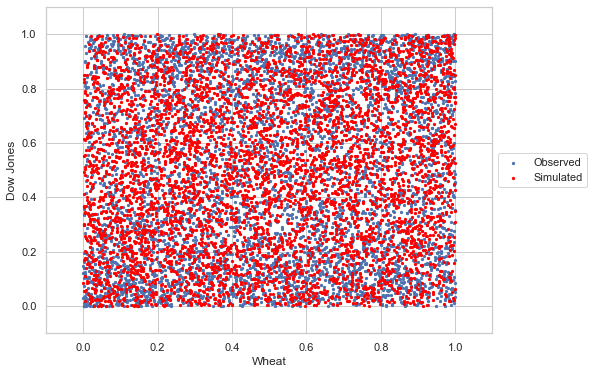

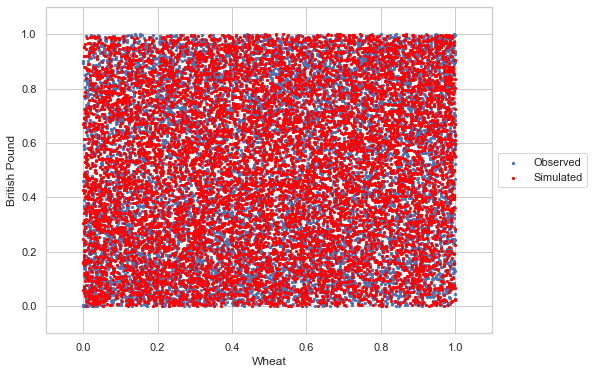

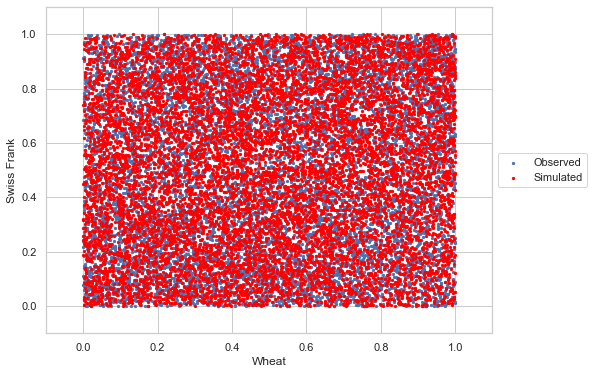

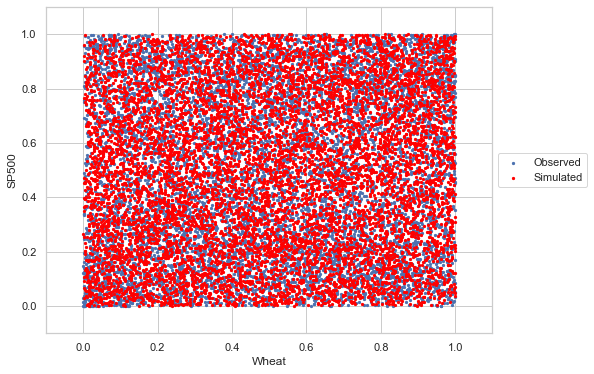

...

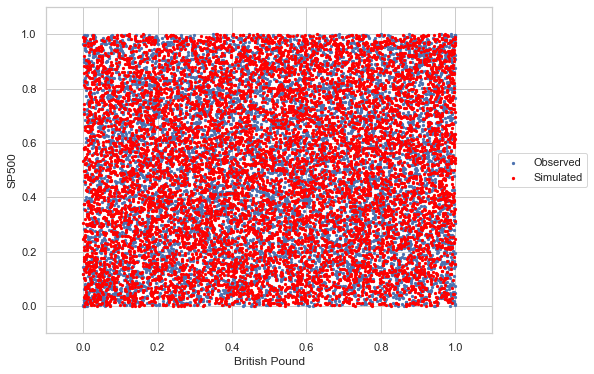

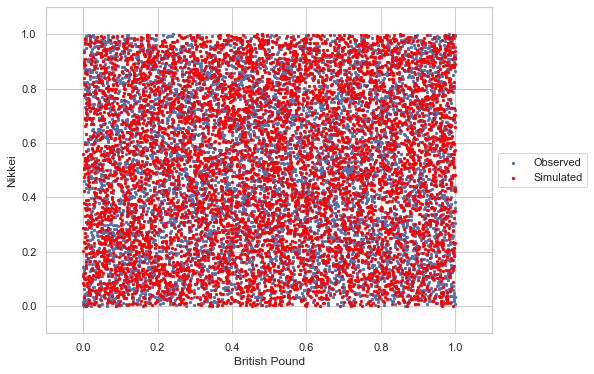

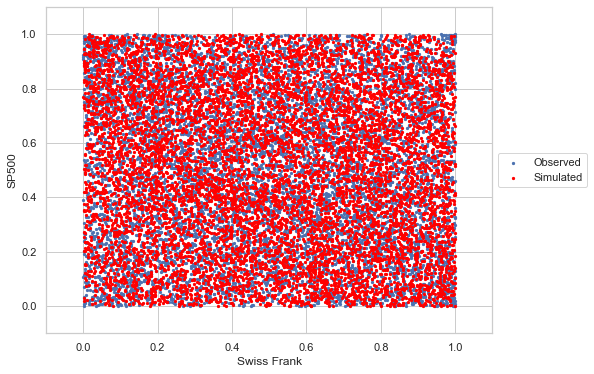

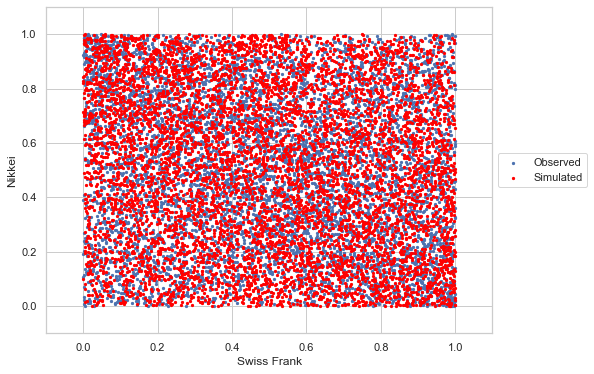

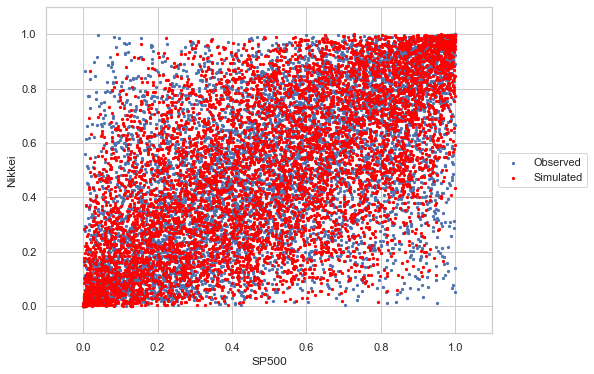

In [5]:
def simulate(ret , n1, n2, N):
    correlation = correlations[f"{n1}-{n2}"]
    mean_vec = [0,0]
    std_vec = [1, 1]
    cov_matrix = np.array([  [std_vec[0]**2, correlation * std_vec[0]*std_vec[1] ], 
                           [ std_vec[0]*std_vec[1]*correlation, std_vec[1]**2]])
    simulations = np.random.multivariate_normal(mean = mean_vec, cov = cov_matrix, size = N)
    simulations = scipy.stats.norm.cdf(simulations)
    #plotting the scatter
    plt.scatter(simulations[:,0], simulations[:,1], color = "red", label = "Simulated", s = 5)
    
    
#confront the simulated with the real data 
for j in range(len(ret.columns)-1):
    for i in range(j+1,len(ret.columns)):
        n1, n2 = ret.columns[j], ret.columns[i]
        scatter(rank_norm, j, i, False)
        simulate(ret , n1, n2, len(ret.iloc[:,[j,i]].dropna()))
        plt.legend(bbox_to_anchor=(1,0.5),fancybox=True, loc = "center left")
        plt.xlim((-0.1,1.1))
        plt.ylim((-0.1,1.1))
        plt.show()
        
        
        

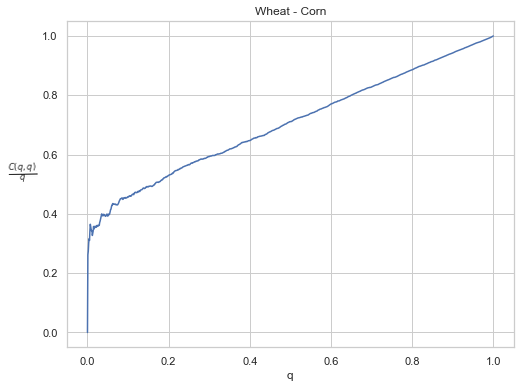

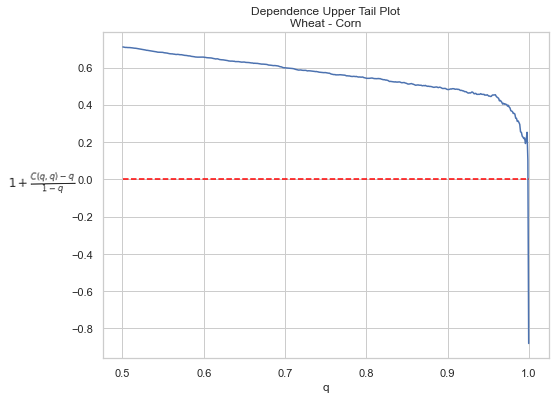

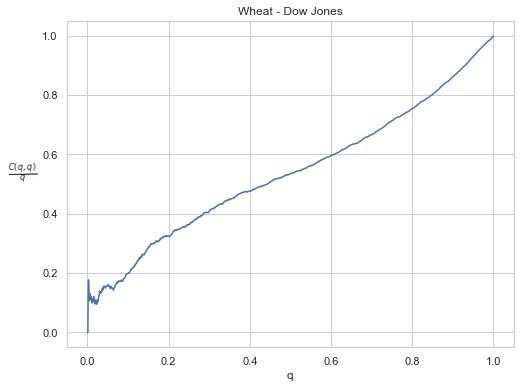

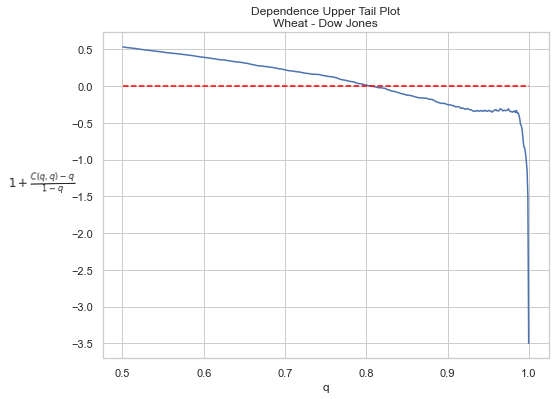

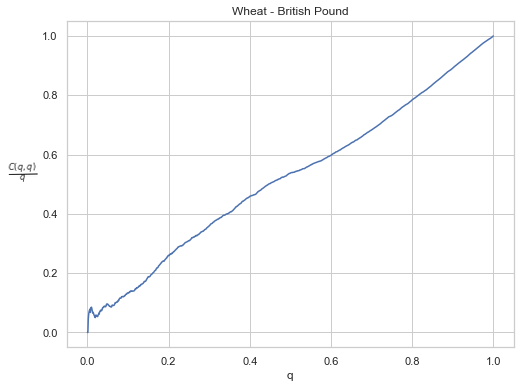

...

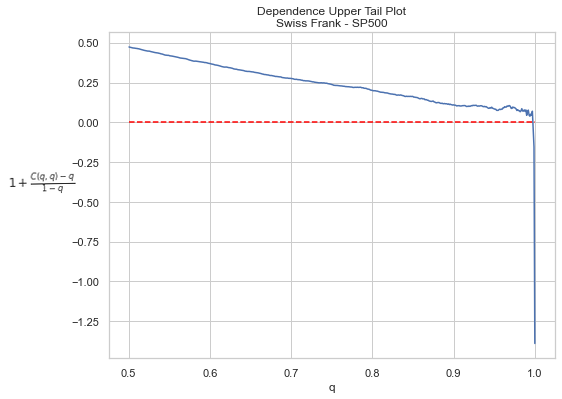

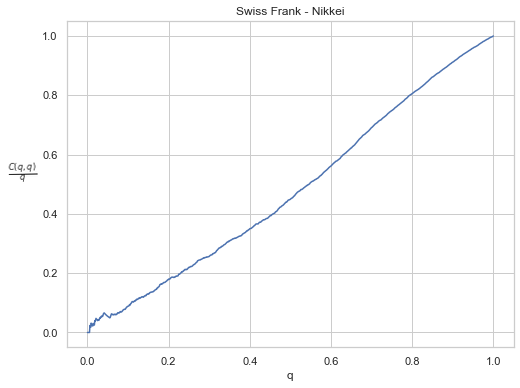

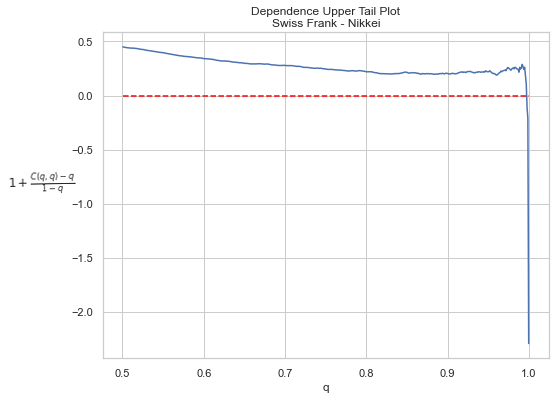

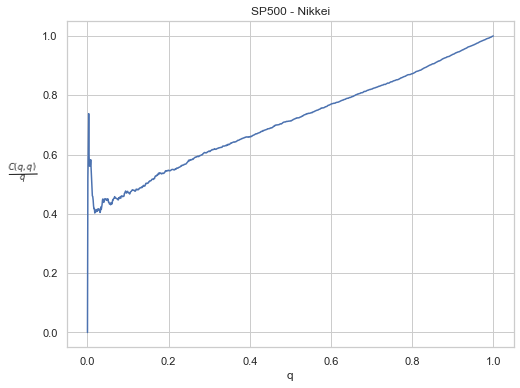

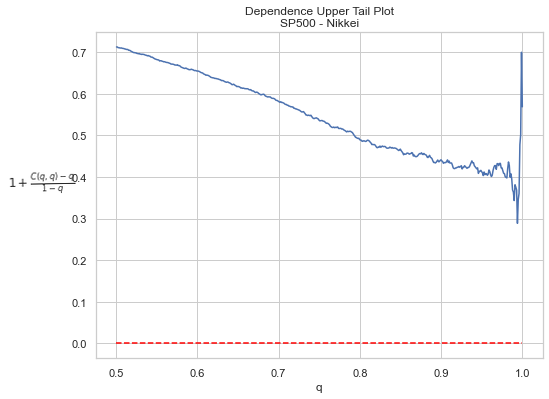

In [6]:
# plot C(q,q)/q for a grid of q in [0,1]
#  C(q,q)/q = P(U1 < q, U2 < q)/q
grid = np.linspace(0.0001,1-0.0001, 1000)

def get_lambda_u(rank_norm, ind1, ind2, q):
    df = rank_norm.iloc[:,[ind1,ind2]].dropna()
    prob = (1*(df <= q)).sum(axis=1) == 2
    cqq = (prob*1).sum()/(len(prob)) 
    return 1 + (cqq-q)/(1-q)

def get_prob(rank_norm, ind1, ind2, q):
    df = rank_norm.iloc[:,[ind1,ind2]].dropna()
    prob = (1*(df <= q)).sum(axis=1) == 2
    return (prob*1).sum()/(q*len(prob)) 

for j in range(len(ret.columns)-1):
    for i in range(j+1,len(ret.columns)):
        n1, n2 = ret.columns[j], ret.columns[i]
        cqq = [get_prob(rank_norm, j, i, q) for q in grid]
        
        
        #calculation for the lambdas coeff
        epsilon = 0.0001
        q_u, q_l = 1-epsilon, epsilon
        cqq_u, cqq_l = get_prob(rank_norm, j, i, q_u), get_prob(rank_norm, j, i, q_l)
        lambda_u =  (cqq_u-q_u)/(1-q_u)
        lambda_l  = cqq_l/q_l
        
        
        #plotting 
        plt.plot(grid, [get_prob(rank_norm, j, i, q) for q in grid])
        plt.xlabel(r"q")
        plt.ylabel(r"${\frac{C(q,q)}{q}}$", labelpad = 20, rotation = 1)
        plt.title(f"{n1} - {n2}") 
        plt.show()
        
        #plotting  upper tails 
        plt.plot(grid[grid>0.5], [get_lambda_u(rank_norm, j, i, q) for q in grid[grid>0.5]])
        plt.plot(grid[grid>0.5], [0 for j in range(len(grid[grid>0.5]))], 
                 color = "red", linestyle = "dashed")
        plt.xlabel(r"q")
        plt.ylabel(r"${1+\frac{C(q,q)-q}{1-q}}$", labelpad = 30, rotation = 1)
        plt.title(f"Dependence Upper Tail Plot\n{n1} - {n2}") 
        plt.show()
        
        
        
